In [1]:
import warnings
import itertools
import numpy as np
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
import pandas as pd
import statsmodels.api as sm
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'

In [2]:
filepath = "D:\\5. Hackathon\\1. 20191012_Wawa_HThon\Sales Forecast\sales.csv"
df = pd.read_csv(filepath)
df['date'] = pd.to_datetime(df['date'])
df = df.set_index('date')
store_num = df.store_number.unique().tolist()

week_resample = []
month_resample = []
year_resample = []

for stores in store_num[0:1]:
    store = df.loc[df['store_number'] ==  stores]
    w = store['sales_index'].resample('W').mean().dropna()
    w = pd.DataFrame(w)
    w['store_number'] = stores
    #y.plot(figsize=(15, 6))
    week_resample.append(w.reset_index().values.tolist())
    
    m = store['sales_index'].resample('M').mean().dropna()
    m = pd.DataFrame(m)
    m['store_number'] = stores
    month_resample.append(m.reset_index().values.tolist())
    
    y = store['sales_index'].resample('Y').mean().dropna()
    y = pd.DataFrame(y)
    y['store_number'] = stores
    year_resample.append(y.reset_index().values.tolist())

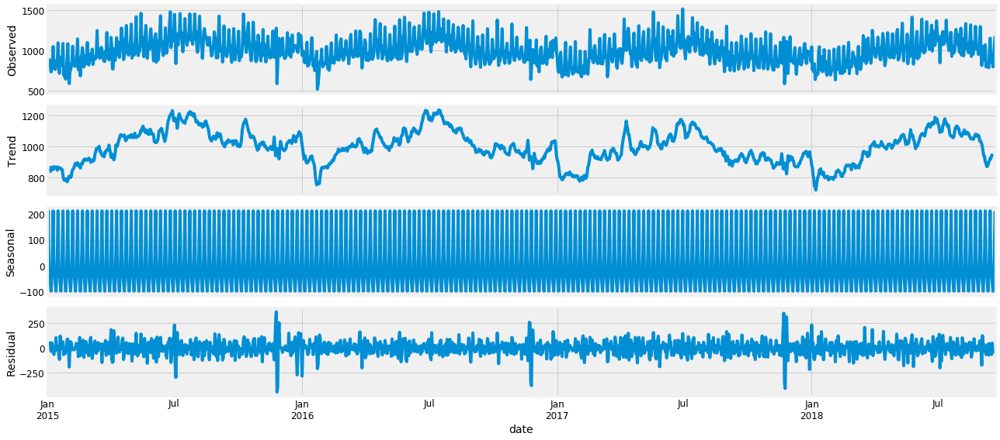

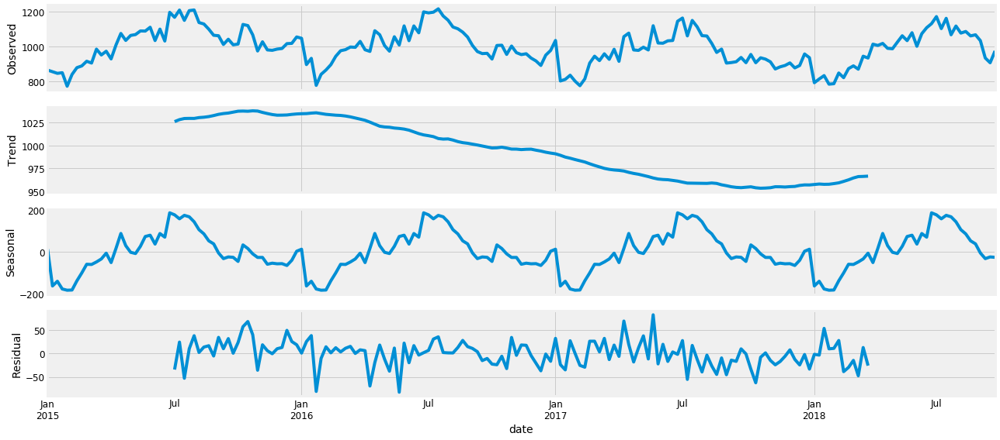

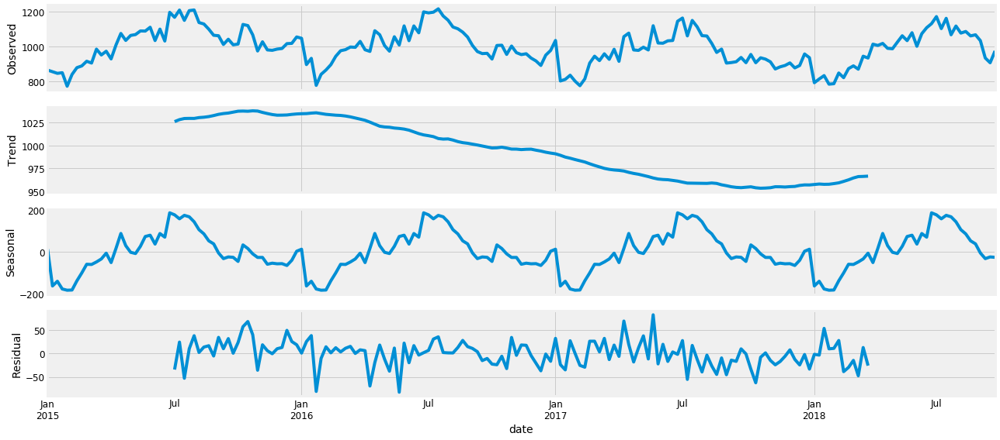

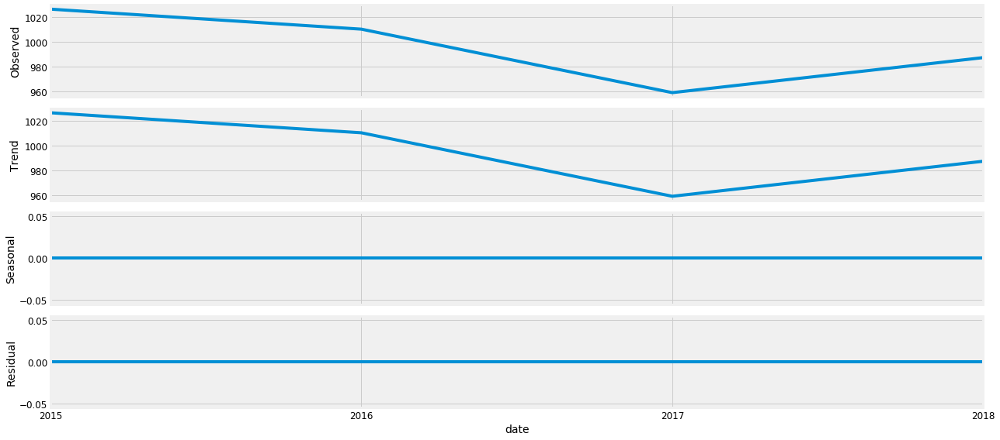

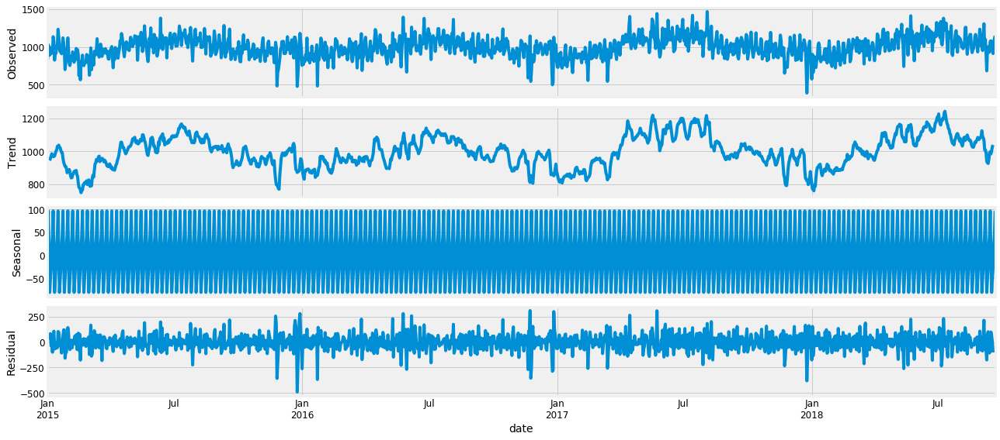

...

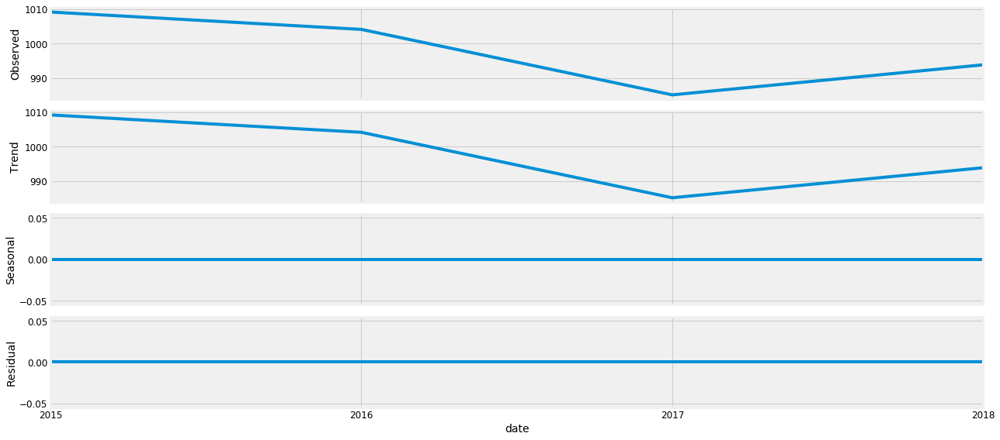

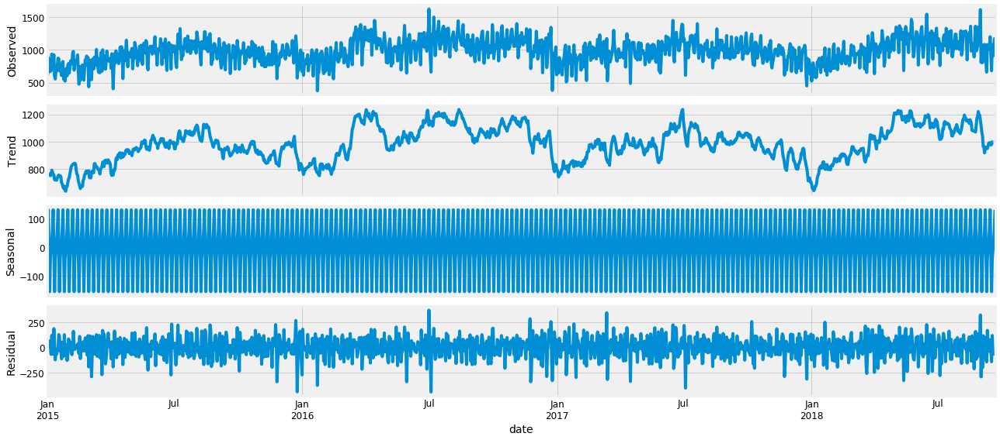

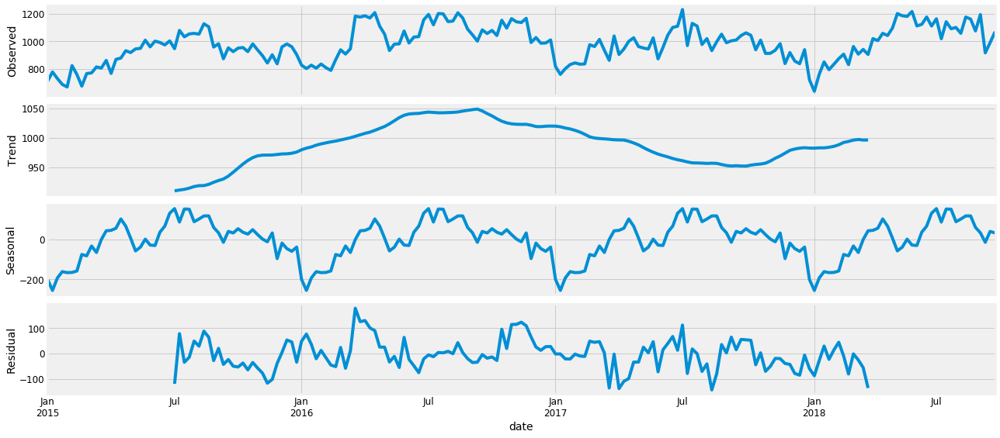

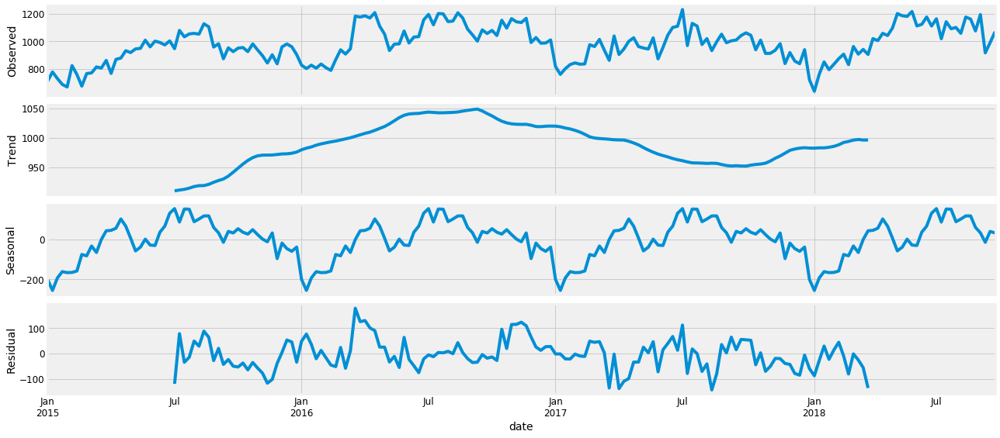

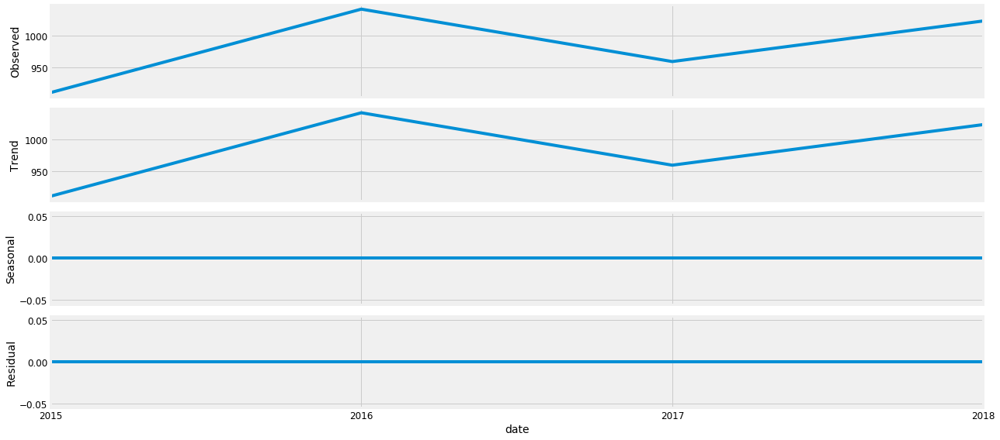

In [26]:
from pylab import rcParams
import os
rcParams['figure.figsize'] = 18, 8
store_num = df.store_number.unique().tolist()

output = "D:\\5. Hackathon\\1. 20191012_Wawa_HThon\Sales Forecast\Output_Fig"

for stores in store_num:
    try:
        store = df.loc[df['store_number'] ==  stores]
        d = store['sales_index'].dropna()
        decomposition = sm.tsa.seasonal_decompose(d, model='additive')
        fig = decomposition.plot()
        if not os.path.exists(output+"\\"+str(stores)):
            os.makedirs(output+"\\"+str(stores))
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_D.png")
        else:
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_D.png")
    except:
        continue
    try:
        w = store['sales_index'].resample('W').mean().dropna()
        decomposition = sm.tsa.seasonal_decompose(w, model='additive')
        fig = decomposition.plot()
        if not os.path.exists(output+"\\"+str(stores)):
            os.makedirs(output+"\\"+str(stores))
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_W.png")
        else:
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_W.png")
    except:
        continue
    
    try:
        m = store['sales_index'].resample('M').mean().dropna()
        decomposition = sm.tsa.seasonal_decompose(w, model='additive')
        fig = decomposition.plot()
        if not os.path.exists(output+"\\"+str(stores)):
            os.makedirs(output+"\\"+str(stores))
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_M.png")
        else:
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_M.png")
    except:
        continue
        
    try:
        y = store['sales_index'].resample('Y').mean().dropna()
        decomposition = sm.tsa.seasonal_decompose(y, model='additive')
        fig = decomposition.plot()
        if not os.path.exists(output+"\\"+str(stores)):
            os.makedirs(output+"\\"+str(stores))
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_Y.png")
        else:
            plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_Y.png")
    except:
        continue

In [4]:
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


C:\Users\harsh\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\harsh\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\harsh\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\harsh\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
C:\Users\harsh\Anaconda3\lib\site-packages\statsmodels\base\model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check

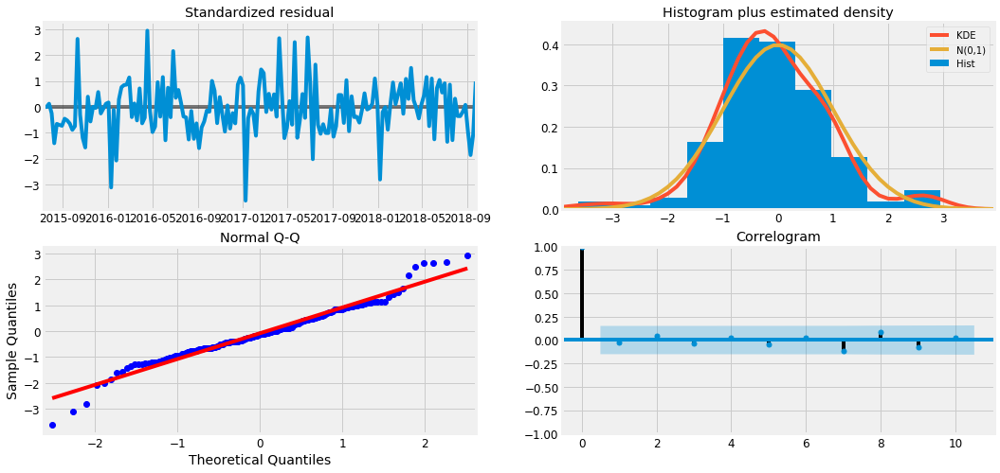

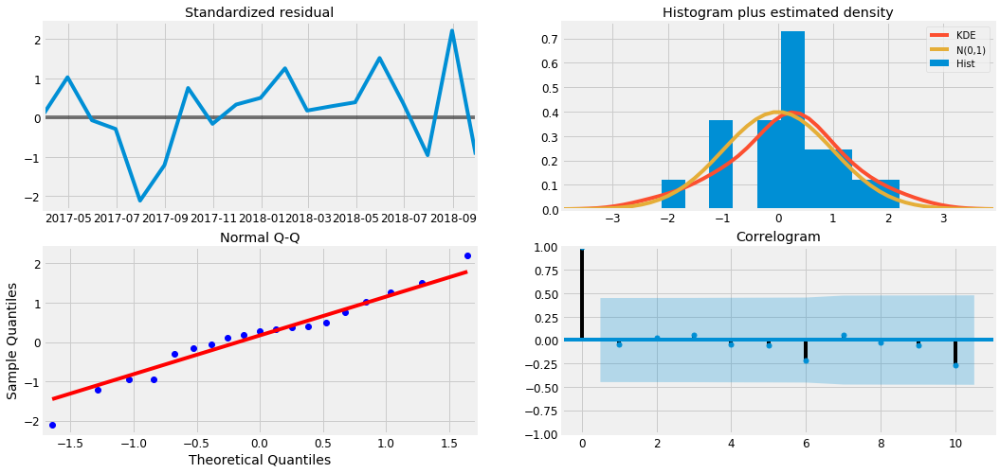

In [15]:
store_num = df.store_number.unique().tolist()
for stores in store_num[0:1]:
    aic_list_w = []
    store = df.loc[df['store_number'] ==  stores]
    w = store['sales_index'].resample('W').mean().dropna()
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(w, order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
                results = mod.fit()
                #rint('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
                aic_list_w.append([param, param_seasonal, results.aic])
            except:
                continue
    aic_list_w.sort(key = lambda x: x[2])

    aic_list_m = []
    m = store['sales_index'].resample('M').mean().dropna()
    for param in pdq:
        for param_seasonal in seasonal_pdq:
            try:
                mod = sm.tsa.statespace.SARIMAX(m, order=param, seasonal_order=param_seasonal, enforce_stationarity=False, enforce_invertibility=False)
                results = mod.fit()
                #rint('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
                aic_list_m.append([param, param_seasonal, results.aic])
            except:
                continue
    aic_list_m.sort(key = lambda x: x[2])
    
    mod_w = sm.tsa.statespace.SARIMAX(w,
                                order=aic_list_w[0][0],
                                seasonal_order=aic_list_w[0][1],
                                enforce_stationarity=False,
                                enforce_invertibility=False)
    results_w = mod_w.fit()
    
    mod_m = sm.tsa.statespace.SARIMAX(m,
                                order=aic_list_m[0][0],
                                seasonal_order=aic_list_m[0][1],
                                enforce_stationarity=False,
                                enforce_invertibility=False)
    results_m = mod_m.fit()
    
    results_w.plot_diagnostics(figsize=(16, 8))
    if not os.path.exists(output+"\\"+str(stores)):
        os.makedirs(output+"\\"+str(stores))
        plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_w_diagnostic.png")
    else:
        plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_w_diagnotic.png")
        
        
    results_m.plot_diagnostics(figsize=(16, 8))
    if not os.path.exists(output+"\\"+str(stores)):
        os.makedirs(output+"\\"+str(stores))
        plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_m_diagnostic.png")
    else:
        plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_m_diagnotic.png")    

        try:
            pred_m = results_m.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=True)
            pred_ci = pred_m.conf_int()
            ax = m['2014':].plot(label='observed')
            pred_m.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
            ax.fill_between(pred_ci.index,
                            pred_ci.iloc[:, 0],
                            pred_ci.iloc[:, 1], color='k', alpha=.2)
            ax.set_xlabel('Date')
            ax.set_ylabel('Sales')
            plt.legend()
            if not os.path.exists(output+"\\"+str(stores)):
                os.makedirs(output+"\\"+str(stores))
                plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_m_prediction.png")
            else:
                plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_m_prediction.png")
        except:
            continue

        try:
            pred_w = results_w.get_prediction(start=pd.to_datetime('2017-01-01'), dynamic=True)
            pred_ci = pred_w.conf_int()
            ax = w['2014':].plot(label='observed')
            pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
            ax.fill_between(pred_ci.index,
                            pred_ci.iloc[:, 0],
                            pred_ci.iloc[:, 1], color='k', alpha=.2)
            ax.set_xlabel('Date')
            ax.set_ylabel('Sales')
            plt.legend()
            if not os.path.exists(output+"\\"+str(stores)):
                os.makedirs(output+"\\"+str(stores))
                plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_w_prediction.png")
            else:
                plt.savefig(output+"\\"+str(stores)+"\\"+str(stores)+"_w_prediction.png")
        except:
            continue  


In [ ]:
# y_forecasted = pred.predicted_mean
# y_truth = y['2017-01-01':]
# mse = ((y_forecasted - y_truth) ** 2).mean()
# print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))
# print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

In [ ]:
# pred_uc = results.get_forecast(steps=100)
# pred_ci = pred_uc.conf_int()
# ax = y.plot(label='observed', figsize=(14, 7))
# pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
# ax.fill_between(pred_ci.index,
#                 pred_ci.iloc[:, 0],
#                 pred_ci.iloc[:, 1], color='k', alpha=.25)
# ax.set_xlabel('Date')
# ax.set_ylabel('Sales')
# plt.legend()
# plt.show()

In [25]:
d

date
2015-01-01     635.555205
2015-01-02     843.583131
2015-01-03     869.183704
2015-01-04     745.343732
2015-01-05     916.588910
2015-01-06     812.374193
2015-01-07     835.674956
2015-01-08     977.428159
2015-01-09    1122.759979
2015-01-10     983.483056
2015-01-11     724.572047
2015-01-12     823.270700
2015-01-13     866.269301
2015-01-14     893.593622
2015-01-15     921.201171
2015-01-16    1063.223256
2015-01-17     898.701134
2015-01-18     691.652219
2015-01-19     830.595440
2015-01-20     792.363697
2015-01-21     781.126846
2015-01-22    1000.816283
2015-01-23     943.492135
2015-01-24     808.045022
2015-01-25     720.286758
2015-01-26     749.176023
2015-01-27     751.357609
2015-01-28     804.559271
2015-01-29     956.571970
2015-01-30     989.138578
                 ...     
2018-08-23    1087.616821
2018-08-24    1221.211909
2018-08-25    1064.843783
2018-08-26     940.897604
2018-08-27    1072.781193
2018-08-28     991.792055
2018-08-29     952.824797
2018-08

In [ ]:
if not os.path.exists(output+"\\"+str(stores)):
    os.makedirs(output+"\\"+str(stores))
        